# Task 6.2: Exploring Relationships

## This script contains:
### 1.  Importing Visualization Libraries and Data
### 2. Exploring Relationships
### 2.1 Correlations
### 2.2 Scatterplots
### 2.3 Pair Plots
### 2.4 Categorical Plots

# 1. Importing Libraries and Data

## Libraries

In [1]:
# import libraries
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
import matplotlib

## Data

In [2]:
# create path
path = r'C:\Users\M de Villiers\Desktop\Data Analytics\Achievement 6'

In [3]:
# import data
df=pd.read_csv(os.path.join(path, '02_Data', 'Prepared_Data', 'monthly_COVID-19_vaccinations_6.csv'), index_col=False)

In [4]:
df.head()

,country,population_estimation_2020,month_year,vaccines,total_vaccinations,people_vaccinated,people_fully_vaccinated,monthly_vaccinations_raw,monthly_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,monthly_vaccinations_per_million
0,Afghanistan,39074280,2021-02,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",8200.0,8200.0,0.0,0.0,8202.0,0.02,0.02,0.00,204.0
1,Afghanistan,39074280,2021-03,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",54000.0,54000.0,0.0,0.0,85894.0,0.14,0.14,0.00,2154.0
2,Afghanistan,39074280,2021-04,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",240000.0,240000.0,0.0,0.0,219606.0,0.60,0.60,0.00,5511.0
3,Afghanistan,39074280,2021-05,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",600152.0,480226.0,119926.0,2859.0,285838.0,1.51,1.21,0.30,7171.0
4,Afghanistan,39074280,2021-06,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",886854.0,699200.0,187654.0,4015.0,242899.0,2.23,1.76,0.47,6097.0


In [5]:
df.tail()

,country,population_estimation_2020,month_year,vaccines,total_vaccinations,people_vaccinated,people_fully_vaccinated,monthly_vaccinations_raw,monthly_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,monthly_vaccinations_per_million
2961,Zimbabwe,14899771,2021-11,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",6611942.0,3795401.0,2816541.0,618042.0,679619.0,43.81,25.15,18.66,45028.0
2962,Zimbabwe,14899771,2021-12,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7264791.0,4124378.0,3135168.0,626997.0,679454.0,48.14,27.33,20.77,45019.0
2963,Zimbabwe,14899771,2022-01,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7632514.0,4270759.0,3299624.0,367723.0,375550.0,50.57,28.30,21.86,24882.0
2964,Zimbabwe,14899771,2022-02,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7890951.0,4362150.0,3396655.0,258437.0,258018.0,52.29,28.90,22.51,17096.0
2965,Zimbabwe,14899771,2022-03,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7943325.0,4379875.0,3412556.0,52374.0,59815.0,52.63,29.02,22.61,3963.0


In [6]:
# check missing values
df.isnull().sum()

country                                0
population_estimation_2020             0
month_year                             0
vaccines                               0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
monthly_vaccinations_raw               0
monthly_vaccinations                   0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
monthly_vaccinations_per_million       0
dtype: int64

In [7]:
df.shape

(2966, 13)

In [8]:
df.dtypes

country                                 object
population_estimation_2020               int64
month_year                              object
vaccines                                object
total_vaccinations                     float64
people_vaccinated                      float64
people_fully_vaccinated                float64
monthly_vaccinations_raw               float64
monthly_vaccinations                   float64
total_vaccinations_per_hundred         float64
people_vaccinated_per_hundred          float64
people_fully_vaccinated_per_hundred    float64
monthly_vaccinations_per_million       float64
dtype: object

# 2. Exploring Relationships

## 2.1 Correlations

In [9]:
matplotlib.__version__

'3.4.3'

In [10]:
%matplotlib inline

In [11]:
# Create a correlation matrix (Question 2)
df.corr()
# These are the variables (except for all the variables that says "per_hundred" or "per_million") I will use for my correlation matrix heatmap which I will create with seaborn

,population_estimation_2020,total_vaccinations,people_vaccinated,people_fully_vaccinated,monthly_vaccinations_raw,monthly_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,monthly_vaccinations_per_million
population_estimation_2020,1.000000,0.744569,0.708831,0.644810,0.725634,0.745017,0.004270,-0.013055,-0.015346,0.008869
total_vaccinations,0.744569,1.000000,0.866271,0.898854,0.694262,0.704755,0.166604,0.130986,0.136273,0.067050
people_vaccinated,0.708831,0.866271,1.000000,0.916509,0.690887,0.710622,0.145252,0.165663,0.144334,0.080035
people_fully_vaccinated,0.644810,0.898854,0.916509,1.000000,0.559005,0.574604,0.163992,0.159291,0.171986,0.056603
monthly_vaccinations_raw,0.725634,0.694262,0.690887,0.559005,1.000000,0.992629,0.068572,0.064369,0.036577,0.140304
monthly_vaccinations,0.745017,0.704755,0.710622,0.574604,0.992629,1.000000,0.071350,0.072343,0.041737,0.153544
total_vaccinations_per_hundred,0.004270,0.166604,0.145252,0.163992,0.068572,0.071350,1.000000,0.924662,0.938527,0.339056
people_vaccinated_per_hundred,-0.013055,0.130986,0.165663,0.159291,0.064369,0.072343,0.924662,1.000000,0.942419,0.431702
people_fully_vaccinated_per_hundred,-0.015346,0.136273,0.144334,0.171986,0.036577,0.041737,0.938527,0.942419,1.000000,0.276455
monthly_vaccinations_per_million,0.008869,0.067050,0.080035,0.056603,0.140304,0.153544,0.339056,0.431702,0.276455,1.000000


## Correlation Matrix Heatmap (Question 3)

In [12]:
# create a correlation heatmap with seaborn
# Create a subset excluding the "country", "month_year" and "vaccines" columns
sub_df = df[['population_estimation_2020', 'total_vaccinations', 'people_vaccinated', 'people_fully_vaccinated', 'monthly_vaccinations_raw', 'monthly_vaccinations']]

In [13]:
sub_df.head()

,population_estimation_2020,total_vaccinations,people_vaccinated,people_fully_vaccinated,monthly_vaccinations_raw,monthly_vaccinations
0,39074280,8200.0,8200.0,0.0,0.0,8202.0
1,39074280,54000.0,54000.0,0.0,0.0,85894.0
2,39074280,240000.0,240000.0,0.0,0.0,219606.0
3,39074280,600152.0,480226.0,119926.0,2859.0,285838.0
4,39074280,886854.0,699200.0,187654.0,4015.0,242899.0


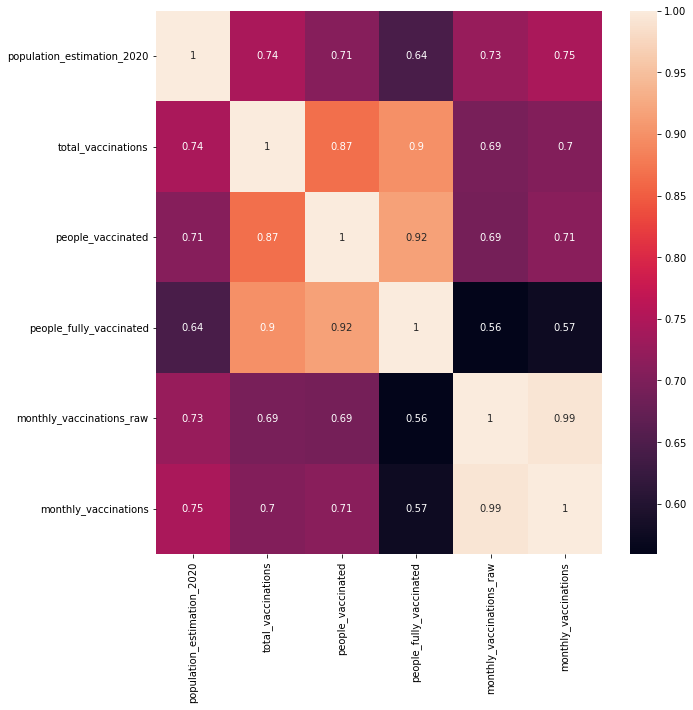

In [14]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn
corr = sns.heatmap(sub_df.corr(), annot = True, ax = ax)

In my dataset there aren't a lot of variables that would have a relationship. My one thought was that perhaps the total population and total vaccinations might have a positive relationship (the bigger the population, the more vaccinations). According to this heatmap, there seems to be a strong relationship between population and total number of vaccinations since the correlation coefficient is 0.74. There are also positive relationships between population and people vaccinated (0.71) and people fully vaccinated (0.64), as well as between population and monthly vaccinations (0.75), although I am not sure how relevant this last relationship is. There is also a strong positive relationship between total vaccinations and people fully vaccinated (0.9), as well as total vaccinations and people vaccinated (this variable differs from people fully vaccinated since it refers to all people who have at least had one shot).

## 2.2 Scatterplots (Question 4)

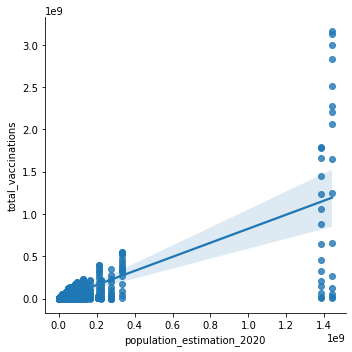

In [15]:
# Population & total vaccinations
sns.lmplot(x = 'population_estimation_2020', y = 'total_vaccinations', data = df)

When looking at this scatterplot, it actually does not look like a linear relationship.

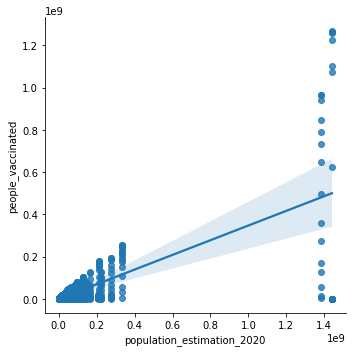

In [16]:
# Population & people vaccinated
sns.lmplot(x = 'population_estimation_2020', y = 'people_vaccinated', data = df)

Just like the previous scatterplot, this one does also not look like a linear relationship.

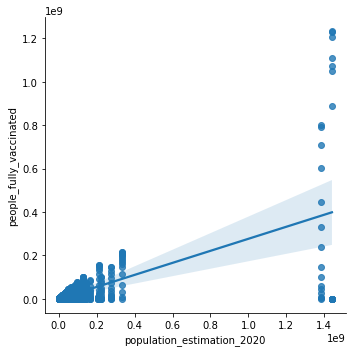

In [17]:
# Population & people fully vaccinated
sns.lmplot(x = 'population_estimation_2020', y = 'people_fully_vaccinated', data = df)

Like the first two scatterplots, this one also does not look like a linear relationship. I think this may be since the size of the population does not always mean there would have been more vaccinations. Some countries started later with the vaccinations rollouts and some countries might have strong beliefs against the vaccine.

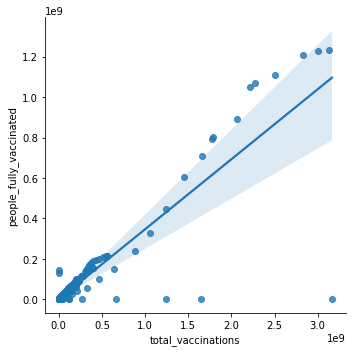

In [18]:
# total vaccinations & people fully vaccinated
sns.lmplot(x = 'total_vaccinations', y = 'people_fully_vaccinated', data = df)

This scatterplot looks a bit more like a real relationship although the relationship is not linear. The relationship is more likely polynomial.

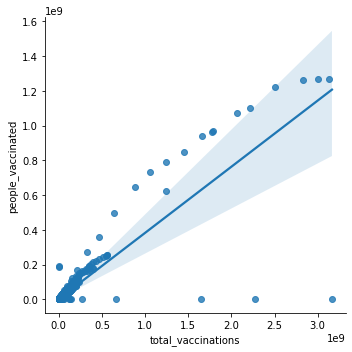

In [19]:
# total vaccinations & people fully vaccinated
sns.lmplot(x = 'total_vaccinations', y = 'people_vaccinated', data = df)

I think the reason why this scatterplot shows even less correlation between total vaccinations and people vaccineated as with people fully vaccinated is because if some people refused to get the vaccine from the beginning, chances are they will not change their minds soon and will never get their first shot, whereas people who are fully vaccinated accounts for at least 2 vaccines per person (some have even received a 3rd booster shot already). Thus the relationship between total vaccinations and people vaccinated are not as strong as between total vaccinations and people fully vaccinated.

## 2.3 Pair Plots (Question 5)

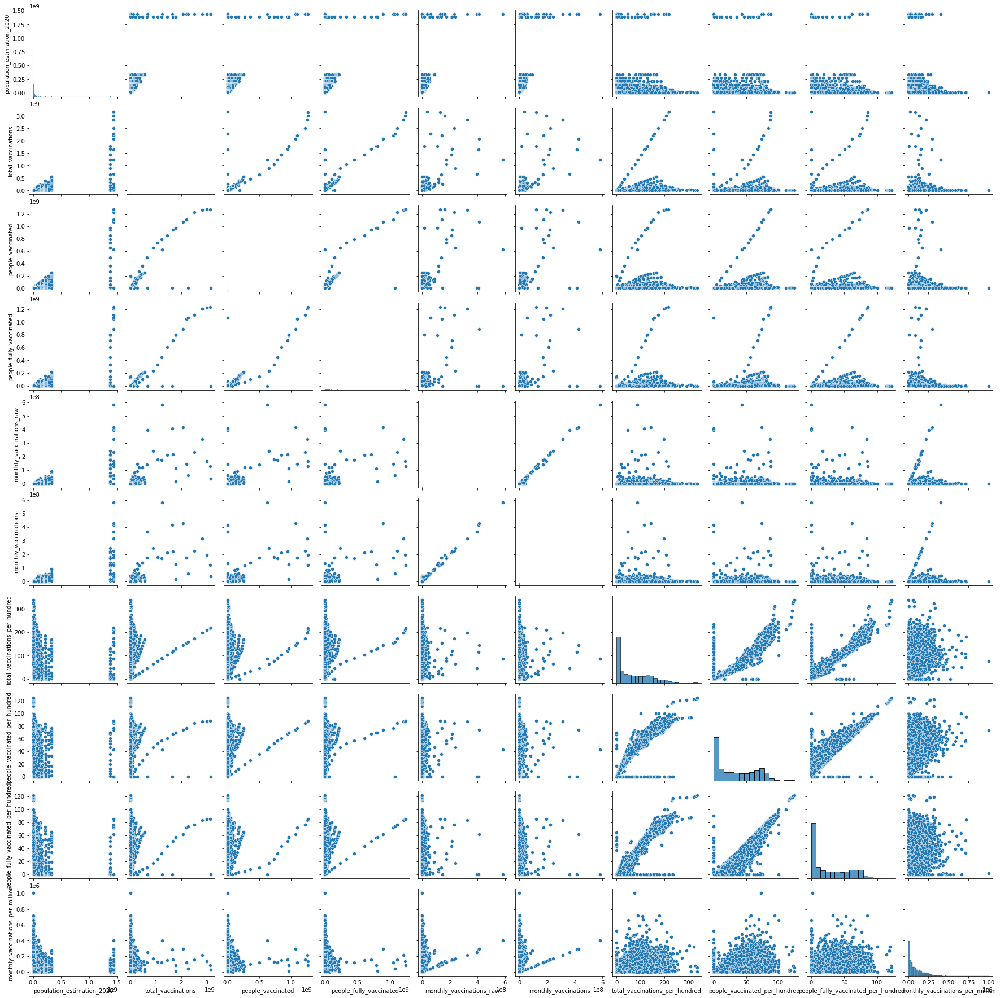

In [20]:
g = sns.pairplot(df)

I would definitely want to take a closer look at total vaccinations, people vaccinated and people fully vaccinated, as well as population vs total vaccinations, people vaccinated and people fully vaccinated, since there seems to be something strange there with countries with large populations and the number of vaccinations they have. I would have to investigate why some large populations do not have a lot of vacciantions and also why there is such a huge jump or gap between population sizes.

## 2.4 Categorical Plots (Question 6)

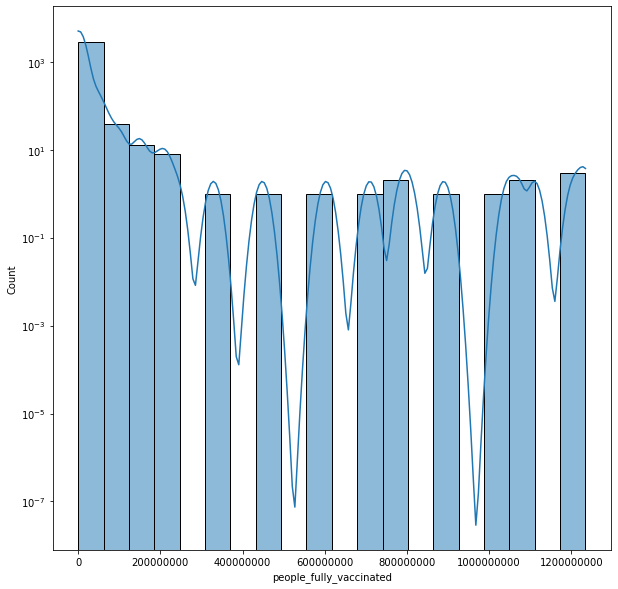

In [21]:
f,ax = plt.subplots(figsize=(10,10))
ax.ticklabel_format(style='plain', axis='both')
g = sns.histplot(df['people_fully_vaccinated'], bins = 20, kde = True, ax=ax).set_yscale('log')


In [22]:
df.loc[df['people_fully_vaccinated'] < 100000000, 'vaccinated_people_category'] = 'Low range'
df.loc[(df['people_fully_vaccinated'] >= 100000000) & (df['people_fully_vaccinated'] < 600000000), 'vaccinated_people_category'] = 'Mid range'
df.loc[df['people_fully_vaccinated'] >= 600000000, 'vaccinated_people_category'] = 'High range'

In [23]:
df['vaccinated_people_category'].value_counts(dropna = False)

Low range     2925
Mid range       30
High range      11
Name: vaccinated_people_category, dtype: int64

In [31]:
# Extracting month and year from date to group by month and date for time series
df['year'] = pd.to_datetime(df['month_year']).dt.to_period('Y')

In [32]:
df.head()

,country,population_estimation_2020,month_year,vaccines,total_vaccinations,people_vaccinated,people_fully_vaccinated,monthly_vaccinations_raw,monthly_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,monthly_vaccinations_per_million,vaccinated_people_category,year
0,Afghanistan,39074280,2021-02,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",8200.0,8200.0,0.0,0.0,8202.0,0.02,0.02,0.00,204.0,Low range,2021
1,Afghanistan,39074280,2021-03,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",54000.0,54000.0,0.0,0.0,85894.0,0.14,0.14,0.00,2154.0,Low range,2021
2,Afghanistan,39074280,2021-04,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",240000.0,240000.0,0.0,0.0,219606.0,0.60,0.60,0.00,5511.0,Low range,2021
3,Afghanistan,39074280,2021-05,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",600152.0,480226.0,119926.0,2859.0,285838.0,1.51,1.21,0.30,7171.0,Low range,2021
4,Afghanistan,39074280,2021-06,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",886854.0,699200.0,187654.0,4015.0,242899.0,2.23,1.76,0.47,6097.0,Low range,2021


In [33]:
df.dtypes

country                                       object
population_estimation_2020                     int64
month_year                                    object
vaccines                                      object
total_vaccinations                           float64
people_vaccinated                            float64
people_fully_vaccinated                      float64
monthly_vaccinations_raw                     float64
monthly_vaccinations                         float64
total_vaccinations_per_hundred               float64
people_vaccinated_per_hundred                float64
people_fully_vaccinated_per_hundred          float64
monthly_vaccinations_per_million             float64
vaccinated_people_category                    object
year                                   period[A-DEC]
dtype: object

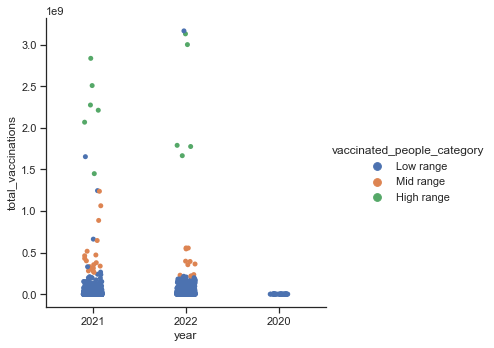

In [34]:
sns.set(style="ticks")
cat = sns.catplot(x="year", y="total_vaccinations", hue="vaccinated_people_category", data=df)
cat.set(yscale="log")

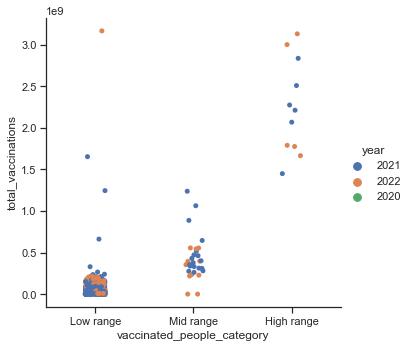

In [35]:
sns.set(style="ticks")
cat2 = sns.catplot(y="total_vaccinations", x="vaccinated_people_category", hue="year", data=df)
cat2.set(yscale="log")

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

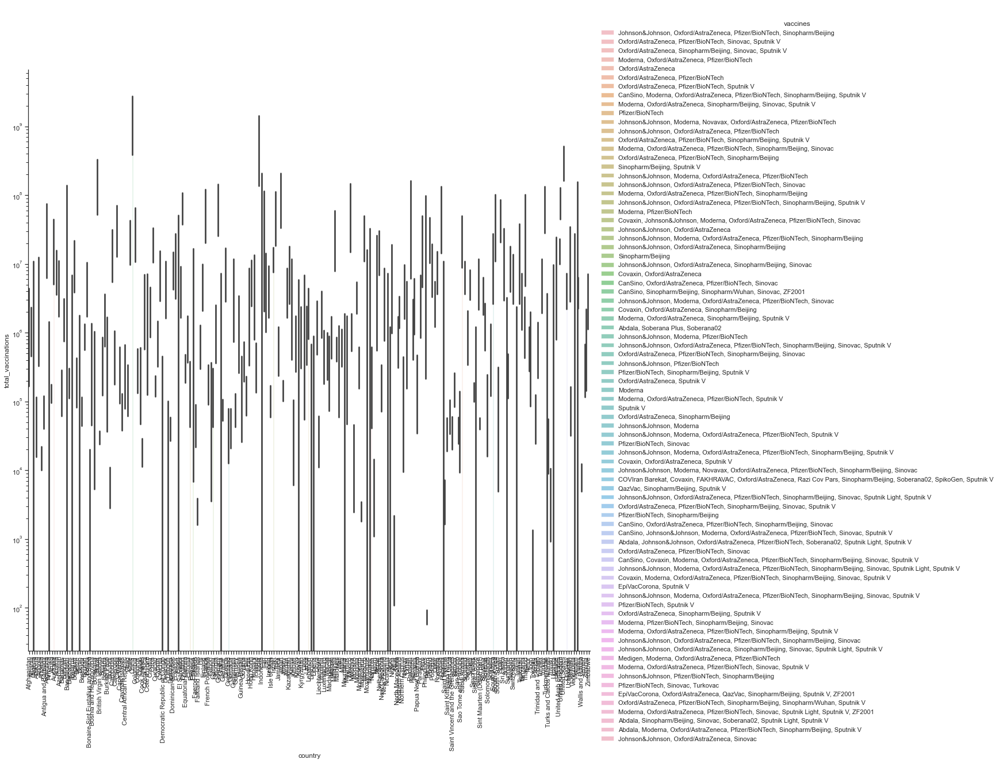

In [104]:
# Which countries are using which vaccines?
sns.set(style="ticks")
bar = sns.catplot(data=df, kind="bar",
    x="country", y="total_vaccinations", hue="vaccines",
    ci="sd", alpha=.6, height=15)
bar.set(yscale="log")
plt.xticks(rotation=90, ha='center')

This catplot did not work so well. With over 200 countries, and almost each country uses a different combination of vaccines. I will have to state my question differently. Perhaps something like, "which countries are using Pfizer-BioNTech?" Then I can create a flag for those that have the Pfizer/BioNTec vaccine among their list of vaccines, etc.

In [50]:
df['use_Pfizer/biontec?'] = "FALSE"

In [51]:
df.loc[df['vaccines'].str.contains("Pfizer/BioNTec"), 'use_Pfizer/biontec?'] = 'TRUE'

In [52]:
df.head()

,country,population_estimation_2020,month_year,vaccines,total_vaccinations,people_vaccinated,people_fully_vaccinated,monthly_vaccinations_raw,monthly_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,monthly_vaccinations_per_million,vaccinated_people_category,year,use_pfizer/biontech?,use_Pfizer/biontec?
0,Afghanistan,39074280,2021-02,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",8200.0,8200.0,0.0,0.0,8202.0,0.02,0.02,0.00,204.0,Low range,2021,No,TRUE
1,Afghanistan,39074280,2021-03,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",54000.0,54000.0,0.0,0.0,85894.0,0.14,0.14,0.00,2154.0,Low range,2021,No,TRUE
2,Afghanistan,39074280,2021-04,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",240000.0,240000.0,0.0,0.0,219606.0,0.60,0.60,0.00,5511.0,Low range,2021,No,TRUE
3,Afghanistan,39074280,2021-05,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",600152.0,480226.0,119926.0,2859.0,285838.0,1.51,1.21,0.30,7171.0,Low range,2021,No,TRUE
4,Afghanistan,39074280,2021-06,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",886854.0,699200.0,187654.0,4015.0,242899.0,2.23,1.76,0.47,6097.0,Low range,2021,No,TRUE


In [53]:
df.tail()

,country,population_estimation_2020,month_year,vaccines,total_vaccinations,people_vaccinated,people_fully_vaccinated,monthly_vaccinations_raw,monthly_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,monthly_vaccinations_per_million,vaccinated_people_category,year,use_pfizer/biontech?,use_Pfizer/biontec?
2961,Zimbabwe,14899771,2021-11,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",6611942.0,3795401.0,2816541.0,618042.0,679619.0,43.81,25.15,18.66,45028.0,Low range,2021,No,FALSE
2962,Zimbabwe,14899771,2021-12,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7264791.0,4124378.0,3135168.0,626997.0,679454.0,48.14,27.33,20.77,45019.0,Low range,2021,No,FALSE
2963,Zimbabwe,14899771,2022-01,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7632514.0,4270759.0,3299624.0,367723.0,375550.0,50.57,28.30,21.86,24882.0,Low range,2022,No,FALSE
2964,Zimbabwe,14899771,2022-02,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7890951.0,4362150.0,3396655.0,258437.0,258018.0,52.29,28.90,22.51,17096.0,Low range,2022,No,FALSE
2965,Zimbabwe,14899771,2022-03,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",7943325.0,4379875.0,3412556.0,52374.0,59815.0,52.63,29.02,22.61,3963.0,Low range,2022,No,FALSE


(array([1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07,
        1.e+08, 1.e+09, 1.e+10, 1.e+11]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

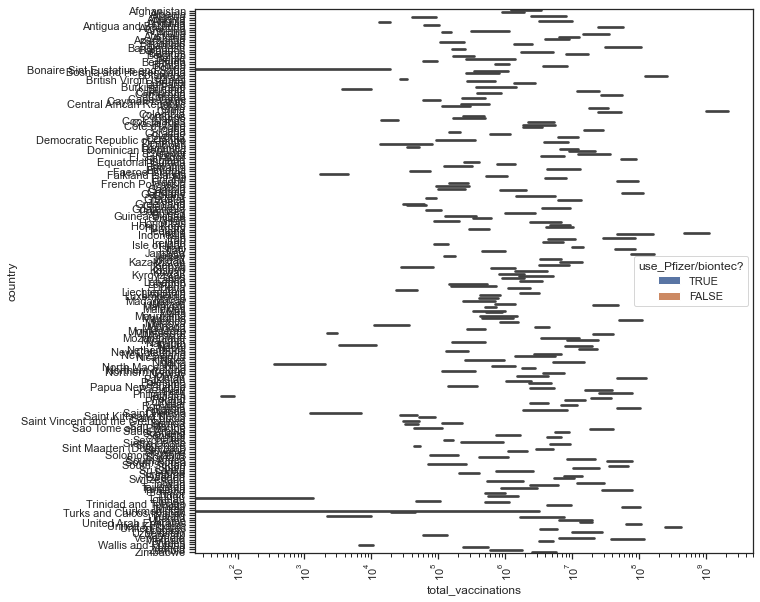

In [107]:
# Which countries are using Pfizer/Biontec?
sns.set_theme(style="darkgrid")
sns.set(style="ticks")
bar1 = sns.barplot(data=df,
    y="country", x="total_vaccinations", hue="use_Pfizer/biontec?")
bar1.set(xscale="log")
plt.xticks(rotation=90, ha='center')

This method also did not work so well. It might make more sense to visualize this question purely by  creating a table. There are simply too many countries to plot on one chart. Or perhaps I need to research this a bit more (or remove the question altogether). I might be able to answer this question in a future exercise when we learn about plotting geographical plots and then add the vaccine combination to each country.

In [195]:
df1 = df.groupby(['country','vaccines', 'use_Pfizer/biontec?'], as_index=False).agg({'total_vaccinations':['max']},  as_index=False)

In [196]:
df1.head()

,country,vaccines,use_Pfizer/biontec?,total_vaccinations
,,,,max
0,Afghanistan,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",TRUE,5597130.0
1,Albania,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...",TRUE,2708574.0
2,Algeria,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",FALSE,13631683.0
3,Andorra,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",TRUE,142420.0
4,Angola,Oxford/AstraZeneca,FALSE,16633167.0


In [197]:
df1.tail()

,country,vaccines,use_Pfizer/biontec?,total_vaccinations
,,,,max
218,Wales,"Moderna, Oxford/AstraZeneca, Pfizer/BioNTech",TRUE,6885224.0
219,Wallis and Futuna,Moderna,FALSE,12849.0
220,Yemen,"Johnson&Johnson, Oxford/AstraZeneca, Sinovac",FALSE,784792.0
221,Zambia,"Johnson&Johnson, Oxford/AstraZeneca, Sinopharm...",FALSE,3027612.0
222,Zimbabwe,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",FALSE,7943325.0


In [148]:
crosstab = pd.crosstab(df1['vaccines'], df1['country'], dropna = False)

In [149]:
crosstab

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wales,Wallis and Futuna,Yemen,Zambia,Zimbabwe
vaccines,,,,,,,,,,,,,,,,,,,,,
"Abdala, Johnson&Johnson, Oxford/AstraZeneca, Pfizer/BioNTech, Soberana02, Sputnik Light, Sputnik V",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Abdala, Moderna, Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm/Beijing, Sputnik V",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
"Abdala, Sinopharm/Beijing, Sinovac, Soberana02, Sputnik Light, Sputnik V",0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
"Abdala, Soberana Plus, Soberana02",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"COVIran Barekat, Covaxin, FAKHRAVAC, Oxford/AstraZeneca, Razi Cov Pars, Sinopharm/Beijing, Soberana02, SpikoGen, Sputnik V",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Pfizer/BioNTech, Sputnik V",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"QazVac, Sinopharm/Beijing, Sputnik V",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sinopharm/Beijing,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


C:\Users\MDEVIL~1\AppData\Local\Temp/ipykernel_16304/665273851.py:6: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


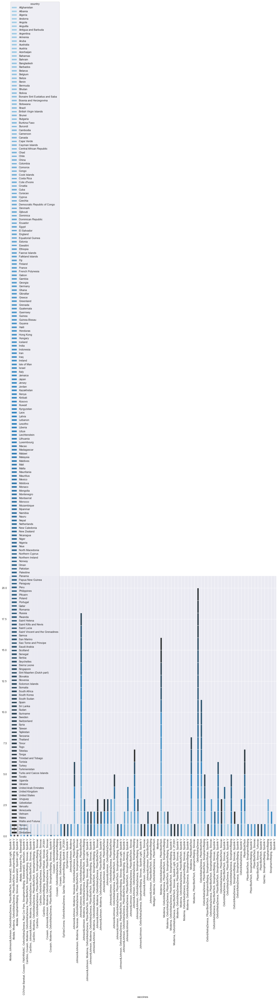

In [169]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_theme(style="darkgrid")
palette = sns.color_palette("Blues_d",n_colors=223)
xtab_stacked = crosstab.plot.bar(stacked = True, color=palette)
plt.xticks(rotation=90, ha='center')
plt.tight_layout()

C:\Users\MDEVIL~1\AppData\Local\Temp/ipykernel_16304/3374367696.py:6: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


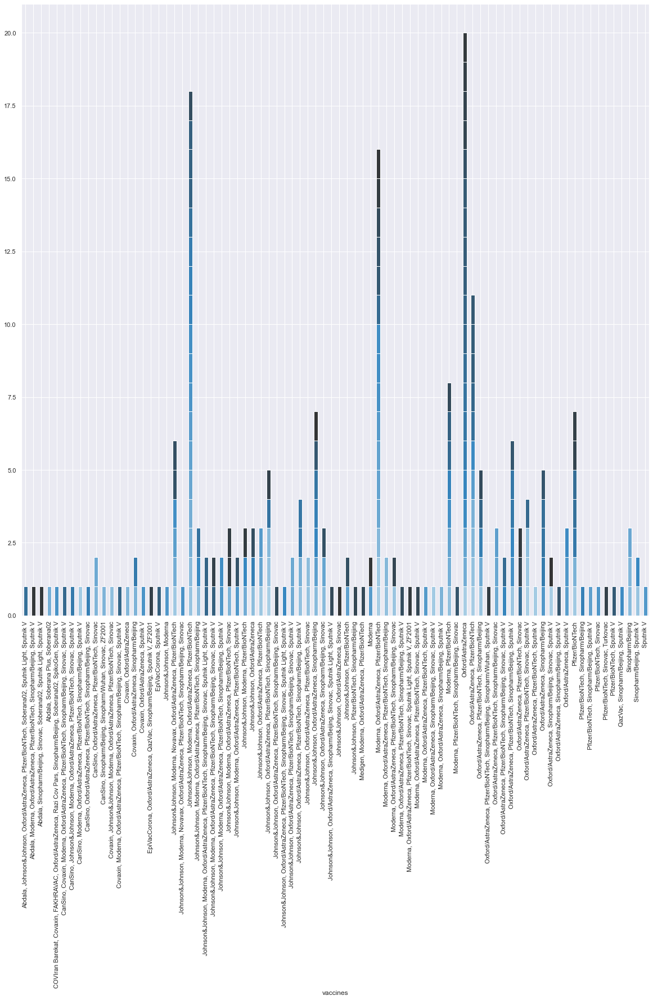

In [170]:
sns.set(rc={'figure.figsize':(20,20)})
sns.set_theme(style="darkgrid")
palette = sns.color_palette("Blues_d",n_colors=223)
xtab_stacked = crosstab.plot.bar(stacked = True, color=palette)
plt.xticks(rotation=90, ha='center')
plt.tight_layout()
plt.legend([],[], frameon=False)

In [154]:
crosstab2 = pd.crosstab(df1['use_Pfizer/biontec?'], df1['country'], dropna = False)

In [155]:
crosstab2

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wales,Wallis and Futuna,Yemen,Zambia,Zimbabwe
use_Pfizer/biontec?,,,,,,,,,,,,,,,,,,,,,
FALSE,0,0,1,0,1,0,0,0,1,0,...,0,0,1,1,0,0,1,1,1,1
TRUE,1,1,0,1,0,1,1,1,0,1,...,1,1,0,0,1,1,0,0,0,0


(array([0, 1]), [Text(0, 0, 'FALSE'), Text(1, 0, 'TRUE')])

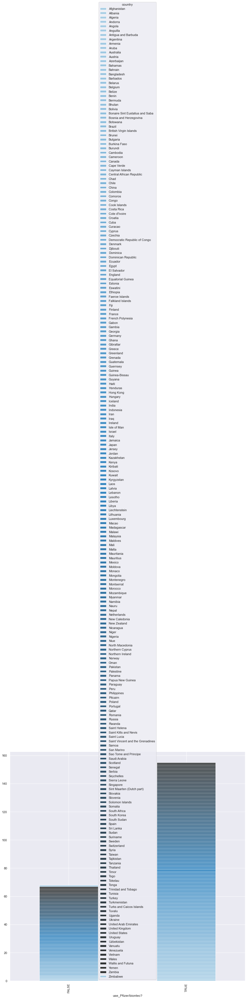

In [167]:
palette = sns.color_palette("Blues_d",n_colors=223)
sns.set(rc={'figure.figsize':(15,15)})
sns.set_theme(style="darkgrid")
xtab_stacked2 = crosstab2.plot.bar(stacked = True, color=palette)
plt.xticks(rotation=90, ha='center')

In [184]:
df['month_year'] = df['month_year'].astype('datetime64[ns]')

In [185]:
df.rename(columns = {'month_year' : 'date'}, inplace = True)

[None]

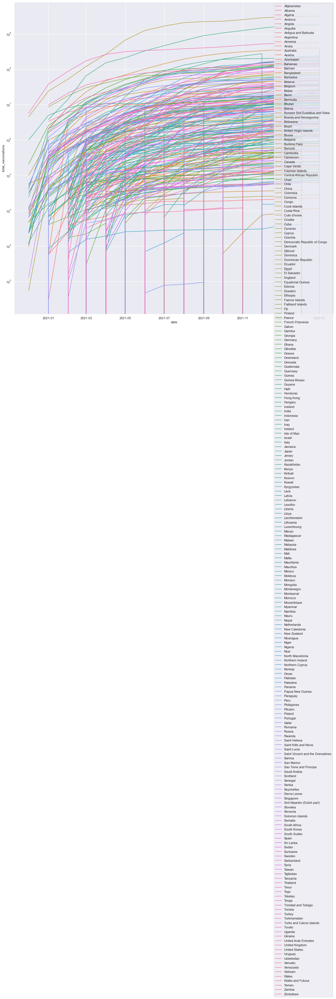

In [203]:
# How have the vaccine rollouts been progressing in each country? 
line = sns.lineplot(data=df, x="date", y="total_vaccinations", hue="country")
plt.legend(loc='upper right')
line.set(yscale="log")

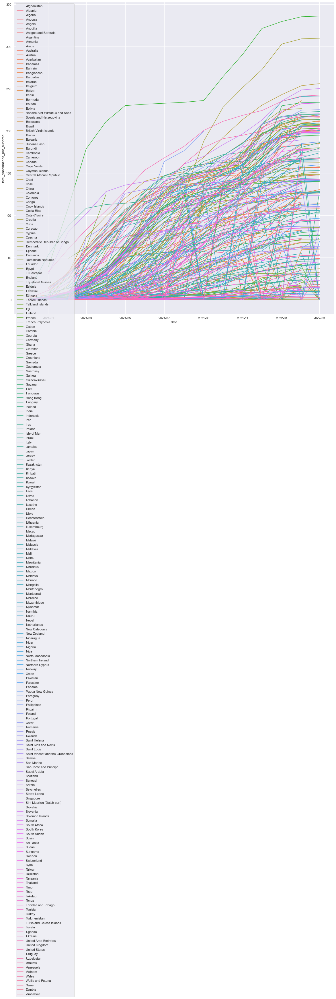

In [199]:
# How have the vaccine rollouts been progressing in each country? 
line1 = sns.lineplot(data=df, x="date", y="total_vaccinations_per_hundred", hue="country")
plt.legend(loc='upper left')

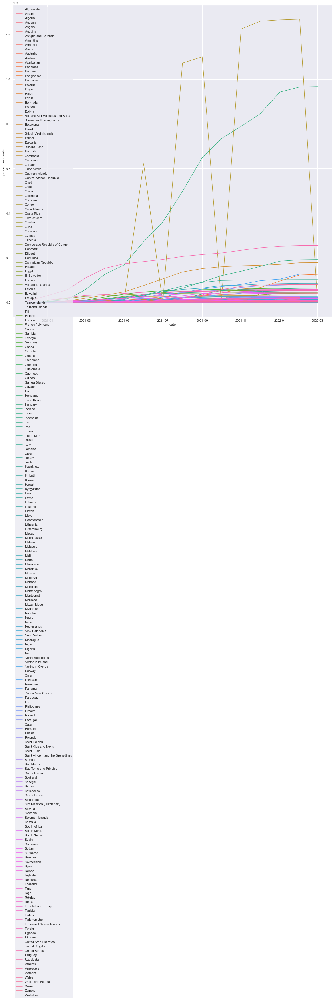

In [190]:
# How have the vaccine rollouts been progressing in each country? 
line2 = sns.lineplot(data=df, x="date", y="people_vaccinated", hue="country")
plt.legend(loc='upper left')

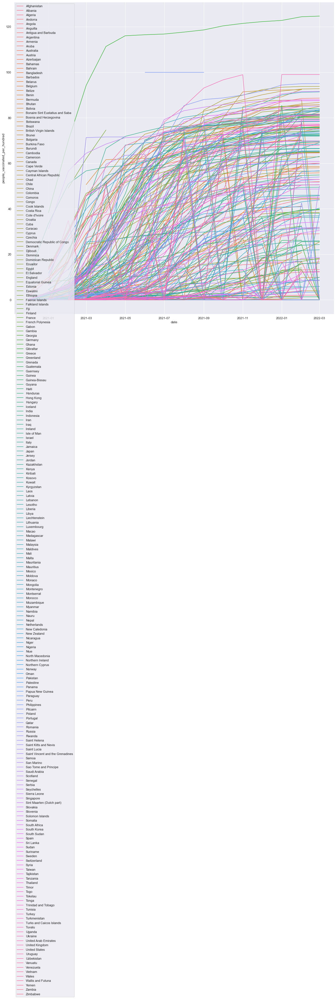

In [202]:
# How have the vaccine rollouts been progressing in each country? 
line3 = sns.lineplot(data=df, x="date", y="people_vaccinated_per_hundred", hue="country")
plt.legend(loc='upper left')

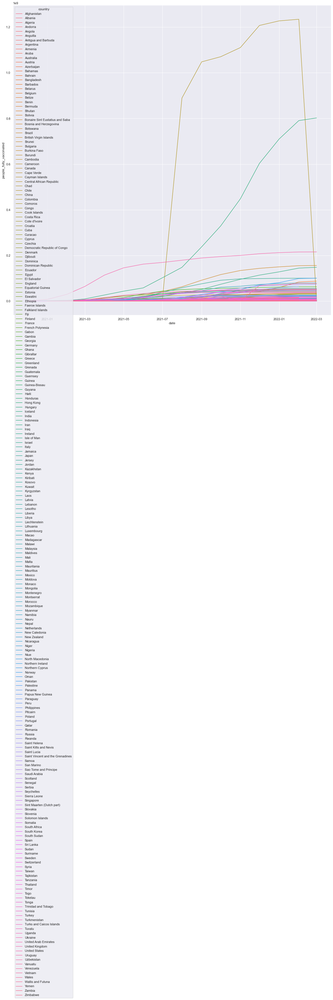

In [191]:
# How have the vaccine rollouts been progressing in each country? 
line4 = sns.lineplot(data=df, x="date", y="people_fully_vaccinated", hue="country")

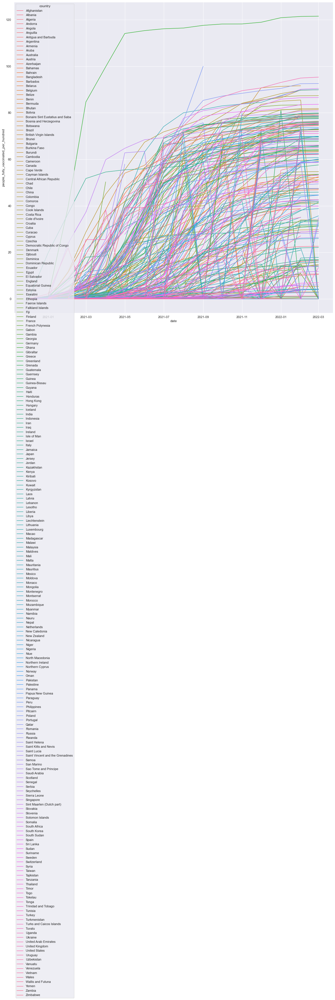

In [201]:
# How have the vaccine rollouts been progressing in each country? 
line5 = sns.lineplot(data=df, x="date", y="people_fully_vaccinated_per_hundred", hue="country")
plt.legend(loc='upper right')

# Question 7

#### Which countries are using which vaccines? 
Looking at the catplots and bar plots, it is not very easy to see exactly which countries are using which vaccines. I would rather rephrase this question to how many of each vaccine-combination are used? The count of each combination. There are 223 countries and 79 different groups of vaccination and this large amount of categories do not plot well. I might be able to plot this answer better using a geographocal plot (each country would have a different colour which will represent the vaccine combination they are using). I was also able to plot which countries are using Pfizer/BioNTec but again since there are 223 countries it is not easy to see which colour represents which country.

#### How have the vaccine rollouts been progressing in each country?
Most countries had a gradual rollout, a rather linear regression, but it seems China and India (if I am reading the colours correctly) have the a much faster progression in their vaccine rollouts - it seems their total vaccinations have almost increased exponentially each month. It is very important to keep in mind that China and India have extremely large populations, thus looking at vaccination per hundred might be more accurate. When looking at it this way, China is in fact not progressing faster. If I am reading the colors correctly it seems Iceland (or Ireland) is progressing the fastest when looking at people fully vaccinated. The green colour in this chart looks different from the 1st chart.

#### Which countries are more advanced and why?
From the visualisations I created, it seems China, Iceland (or Ireland), and New Zealand seem to be most advanced (looking at the final number on the people_fully_vaccinate_per_hundred line chart).

#### Which countries had the first batch of vaccines?
There are many countries who started in December 2020 with vaccinations. It is not very easy to see on the line chart. I think among them are the US, the UK, India, China, New Zealand, Russia and Germany. I would say the countries where vaccines were developed and first world countries were among the first.

#### Eventually, I would also want to know what the effect of the vaccines has been on the COVID-19 situation worldwide? 
This question I will answer once I introduce another dataset (I think one of the future exercises have this requirement to add another dataset)

# Question 8

#### My hypotheses are: 
1. "The bigger a country's population, the more vaccinations they administer per month"
2. "The more vaccinations are administered, the more people are fully vaccinated"
3. "The more vaccinations are administered, the less covid-19 deaths there are" (this is a hypothesis that will be tested later).